## Anemia step 1 (cell types or lineages)

*2011104* - Chris Lausted

This notebook adjusts gene expression for the aggregated four experiments and identifies the major cell lineages/types.  We apply BBKNN (batch-corrected neighbors) to integrate all samples onto the same UMAPs. 

The input file is `heme_velo_4exp_step00.raw.200330.h5ad` and was produced by `a_step00_agg.ipynb`.  The output is saved to `heme_velo_4exp_step01_lineage.200331.h5ad`.  

Hematopoiesis figures [here](https://en.wikipedia.org/wiki/Haematopoiesis#/media/File:Hematopoiesis_(human)_diagram_en.svg).  Libraries and documentation: 
[AnnData](https://icb-anndata.readthedocs-hosted.com/en/latest/anndata.AnnData.html), 
[ScanPy](https://scanpy.readthedocs.io/en/stable/), 
[Palantir](https://icb-scanpy.readthedocs-hosted.com/en/stable/external/scanpy.external.tl.palantir.html#scanpy.external.tl.palantir), 
[Palantir example](https://github.com/dpeerlab/Palantir/blob/master/notebooks/Palantir_sample_notebook.ipynb)

In [ ]:
import datetime, pytz
print(datetime.datetime.now(pytz.timezone('America/Vancouver')).strftime("%I:%M %p - %e %B %Y - %A"))

11:25 AM -  5 November 2020 - Thursday


### Install ScanPy via Pip

Use Conda software distribution system and install libraries chosen to not conflict with the built-in libraries that Colab uses.  

In [ ]:
!python --version  ## Note Colab's default Python version.  Should be 3.6+

Python 3.6.9


In [ ]:
%%bash
## Install leiden/louvain from tarball to avoid slow compilation.   
apt install -q python3-igraph python3-h5py python3-networkx  > install.log

#tar -czf leidenalg.tar.gz /usr/local/lib/python3.6/dist-packages/leidenalg /usr/local/lib/python3.6/dist-packages/louvain
if [ ! -f leidenalg_0-7-0.tgz ]; then 
  gdown 'https://drive.google.com/uc?id=1HWyzQR8_xw-aholmCVX9pyFPkoLz5Q9P'
  tar -xzf leidenalg_0-7-0.tgz -C /
fi
#ls -lh /usr/local/lib/python3.6/dist-packages/leidenalg
#ls -lh /usr/local/lib/python3.6/dist-packages/louvain

## Use pip to install scanpy, scvelo, Scribe.  Takes 1 min. 
pip install -q scanpy scvelo magic-impute bbknn  >> install.log



Downloading...
From: https://drive.google.com/uc?id=1HWyzQR8_xw-aholmCVX9pyFPkoLz5Q9P
To: /content/leidenalg_0-7-0.tgz
2.15MB [00:00, 68.2MB/s]


In [ ]:
## Set up ScanPy
import warnings, gc, magic, bbknn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scvelo as scv
import loompy

#sc.logging.print_versions()
print("loompy ==",loompy.__version__)
np.random.seed(0)  ## We wish to make this notebook reproducible.
sc.settings.verbosity=0  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=90)
#warnings.filterwarnings('ignore')

loompy == 3.0.6


### Download Our SC Data

In [ ]:
## Aggregated veloctyo and protein data; 910MB takes 30s. 
#https://drive.google.com/open?id=1kbpvQel_HFSML0dCwkpUZ00Sap1ohawA
! [ -e heme_velo_4exp_step00.raw.200406.h5ad ] || gdown 'https://drive.google.com/uc?id=1kbpvQel_HFSML0dCwkpUZ00Sap1ohawA'

Downloading...
From: https://drive.google.com/uc?id=1kbpvQel_HFSML0dCwkpUZ00Sap1ohawA
To: /content/heme_velo_4exp_step00.raw.200406.h5ad
910MB [00:14, 64.2MB/s]


In [ ]:
ad1 = sc.read_h5ad("heme_velo_4exp_step00.raw.200406.h5ad")

In [ ]:
ad1

AnnData object with n_obs × n_vars = 50148 × 33538
    obs: 'batch', 'condition', 'day', 'exp', 'id', 'kit', 'prob', 'barcode', 'trajectoryb', 'hap', 'reads', 'CD70_pro', 'CD36_pro', 'CD71_pro', 'CD3_pro', 'CD235a_pro', 'CD14_pro', 'CD117_pro', 'CD11b_pro'
    var: 'Accession', 'Chromosome-E1', 'End', 'Start', 'Strand-E1', 'Chromosome-E2', 'Strand-E2', 'Chromosome-E3', 'Strand-E3', 'Chromosome-E4', 'Strand-E4'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [ ]:
## Get percent Mito.  (.A1 converts sparse to dense matrix)
mito_genes = ad1.var_names.str.startswith('MT-')
ad1.obs['percent_mito'] = np.sum(ad1[:, mito_genes].X, axis=1).A1 / np.sum(ad1.X, axis=1).A1
ad1.obs['n_counts'] = ad1.X.sum(axis=1).A1
gc.collect()

24291

In [ ]:
## How many cells over 15% Mito?  Discard these 1580.  48568 remain. 
print("Cells over 15% Mito:", len(ad1[ad1.obs['percent_mito']>0.15]))
ad1 = ad1[ad1.obs['percent_mito']<=0.15]
ad1

Cells over 15% Mito: 1580


View of AnnData object with n_obs × n_vars = 48568 × 33538
    obs: 'batch', 'condition', 'day', 'exp', 'id', 'kit', 'prob', 'barcode', 'trajectoryb', 'hap', 'reads', 'CD70_pro', 'CD36_pro', 'CD71_pro', 'CD3_pro', 'CD235a_pro', 'CD14_pro', 'CD117_pro', 'CD11b_pro', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome-E1', 'End', 'Start', 'Strand-E1', 'Chromosome-E2', 'Strand-E2', 'Chromosome-E3', 'Strand-E3', 'Chromosome-E4', 'Strand-E4'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [ ]:
## First filter genes.  
#sc.pp.filter_cells(ad1, min_genes=20)  ## crashes.  
scv.pp.filter_genes(ad1, min_cells=20)
gc.collect()
ad1.shape

Trying to set attribute `.obs` of view, copying.


Filtered out 16659 genes that are detected in less than 20 cells (spliced).


(48568, 16879)

In [ ]:
## Second, filter cells.  It counts n_genes.  
sc.pp.filter_cells(ad1, min_genes=20) 
gc.collect()
ad1.shape

(48565, 16879)

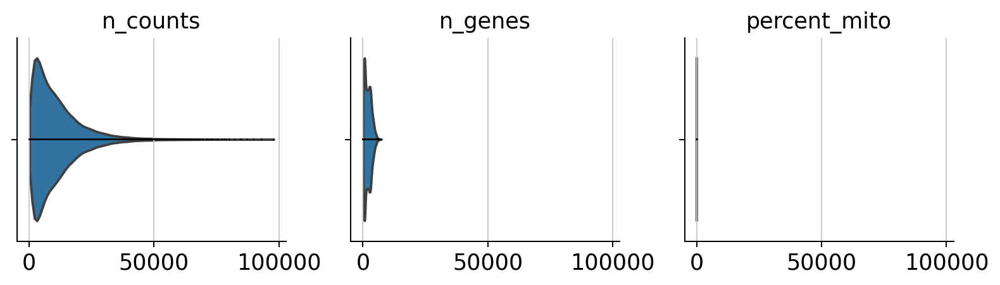

In [ ]:
## Show some quality metrics.
## n_genes not calculated.  jitter=0.5
sc.pl.violin(ad1, ['n_counts', 'n_genes', 'percent_mito'], jitter=False, multi_panel=True)  

In [ ]:
## Normalization.  Use scvelo to also normalize splice layers. 
scv.pp.normalize_per_cell(ad1, counts_per_cell_after=1e4)  ## Remove `counts_per_cell_after=1e4`

Normalized count data: X, spliced, unspliced.


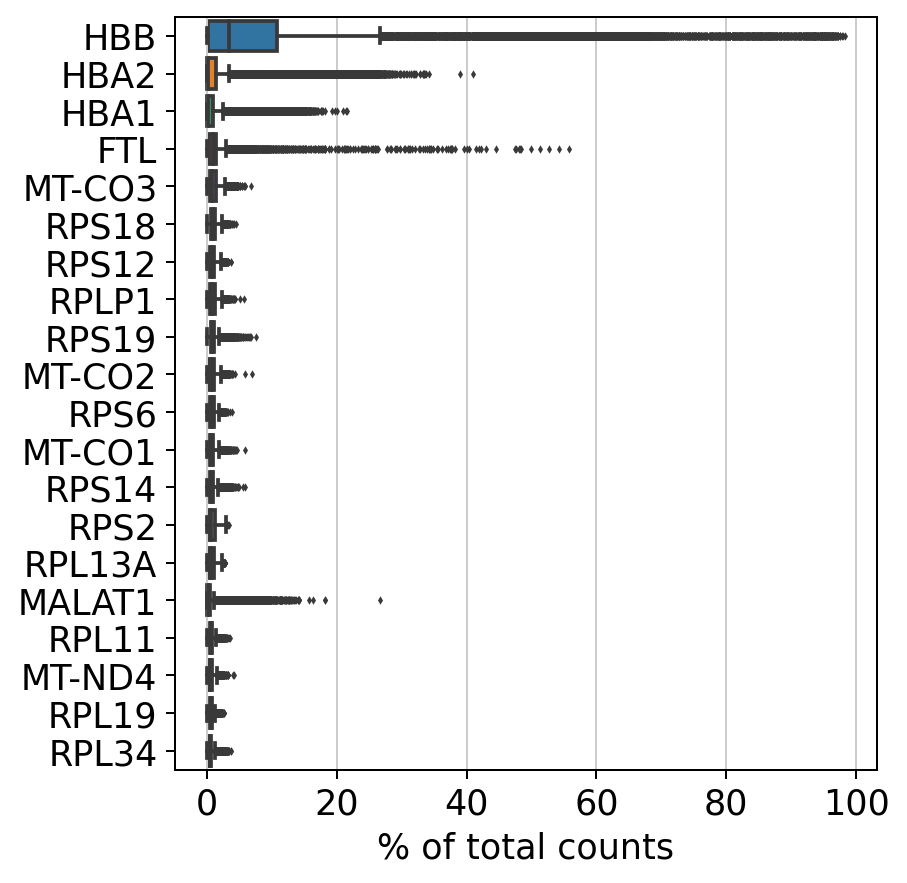

In [ ]:
sc.pl.highest_expr_genes(ad1, n_top=20)

In [ ]:
## No scvelo tool for scale.  Omit. 
#sc.pp.scale(ad1)

## Log transform. 
scv.pp.log1p(ad1)
## Take log of SPARTA counts. 
sparta = [x for x in ad1.obs if x.startswith('CD')]
for x in sparta:
  ad1.obs[x] = np.log1p(ad1.obs[x])

Calculate cell type marker panels now, before discarding any more genes from anndata object. 

In [ ]:
## Cell type marker panels.  Six for each.  From literature, confirmed here. 
import time
markers = dict(
  T = ['CD3D','TRAC','CD8A','CD4','CXCR4'] + ['BTG1'], 
  Mac = ['TYROBP','FCER1G','CD14','S100A8','S100A9','LYZ'], 
  B = ['CD27','CD74','CD79B','IGKC','IGHM','MZB1'], 
  DC = ['PLD4','ITM2C','JCHAIN','CD40','PLIN2','LGALS3BP'], 
  NK = ['GNLY','NKG7','PRF1','KLRB1','GZMA', 'CTSW'], 
  Neu = ['PRSS57','SMIM24','ELANE','AZU1','PRTN3','CFD'],
  Ery = ['HBA1','CA1','SLC4A1','GYPA','TFRC','HMGA1'], 
  Meg = ['CD9', 'LOX', 'VWF', 'NFIB', 'TGFB1', 'FLI1'],
  Mast = ['CCL2', 'CREB3L1', 'GNAI1', 'PLAU', 'KCNE3', 'SRGN'], 
  MPP = ['KIT', 'CCL2', 'GATA2', 'GATA4', 'RUNX1', 'TRIM33'], 
  CLP = ['SPINK2','DNTT','CD79A','EBF1','IGHM'],  
  Mito = ['MT-ND1','MT-ND3','MT-ND4','MT-CO2','MT-CYB'],  
  Hb = ['HBA1','HBA2','HBB','HBG1','HBG2','HBD','HBE1','HBZ']
  )

## This may crash Google Colab if not a high-RAM runtime.
for panel,keygenes in markers.items():
  sc.tl.score_genes(ad1, keygenes, gene_pool=None, score_name=panel)
  gc.collect(); time.sleep(2)

Calculate cell cycle. 

In [ ]:
## Calcuate cell cycle and save in obs['phase']
s_genes = [ 'MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 'GINS2', 'MCM6', 'CDCA7', 'DTL', 
  'PRIM1', 'UHRF1', 'MLF1IP', 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 'SLBP', 'CCNE2', 
  'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 
  'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8' ]
g2m_genes = [ 'HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A', 'NDC80', 'CKS2', 
  'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF', 'TACC3', 'FAM64A', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 
  'AURKB', 'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP', 'CDCA3', 'HN1', 'CDC20', 
  'TTK', 'CDC25C', 'KIF2C', 'RANGAP1', 'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR', 
  'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF', 'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA' ] 
s_genes = [x for x in s_genes if x in ad1.var_names]
g2m_genes = [x for x in g2m_genes if x in ad1.var_names]

sc.tl.score_genes_cell_cycle(ad1, s_genes=s_genes, g2m_genes=g2m_genes) 

Mark key genes that we must not discard.  Then discard genes that are not varying (low dispersion). 

In [ ]:
## Mark key genes & proteins that we must keep.
keygenes = ["HBB","HBA1","GYPA","GYPB","GATA1","TAL1","KLF1","KLF3","ZFPM1","EIF2AK1","E2F2","TFRC","SLC25A37",
  "SLC48A1","ALAS2","HMBS","FECH","TOP2A","KIF11","HEMGN","RPL35","RPL8","RPL4","RPL5","RPL11","RPS14","RPS19",
  "MRPL57","MRPL40","CDKN1A","SLC7A11","GPX4","PRDX2","GPX1","COX6B1","CYC1","NDUFA8","NDUFB6","SDHB","PSMA2",
  "PSMB2","SMC2","KIF22","KIF2A","SMC1A","SMC4","KIF2C","AURKA","AURKB","GCLM","FTH1","FTL","MAF1","KEAP1",
  "SLC52A2", "SLC20A1", "SLC20A2", "XPR1", "FLVCR1", "SLC5A6", "SLC1A5", "SLC2A1",
  "TRIB2", "CA2" ]
ad1.var['keygene'] = [x in keygenes for x in list(ad1.var_names)]
print(sum(list(ad1.var['keygene'])))

62


In [ ]:
'''
## By SCANPY.  Find the 2500 most variable (important) genes. 
## Must use batch_key='day' or 'batch' as there is big E1/E2 vs E3/E4 difference. 
sc.pp.highly_variable_genes(ad1, flavor='cell_ranger', n_top_genes=2500, subset=False, batch_key=None)

## Create new ad2 with variable and key genes.
keep = ad1.var['highly_variable'] | ad1.var['keygene']
ad2 = ad1[:,keep].copy()
gc.collect()
ad2
'''
pass

In [ ]:
## By SCVELO.  Find the 7500 most variable (important) genes.   
## If log already, use (flavor='cell_ranger', log=False). 
ad2 = scv.pp.filter_genes_dispersion(ad1, flavor='cell_ranger', log=False, n_top_genes=7500, copy=True) 

## Make a list of varying genes and key genes. 
keepset = set(list(ad2.var_names) + keygenes)
print("Wish to keep this number of genes:", len(keepset))
## Make a boolean list for reducing size of anndata. 
keepvec = [x in keepset for x in list(ad1.var_names)]
## Create smaller anndata object.
ad2 = ad1[:,keepvec]

Exctracted 7500 highly variable genes.
Wish to keep this number of genes: 7525


In [ ]:
## Note top 1/4 variable genes, but don't remove them.  (Use sc not scv) 
sc.pp.filter_genes_dispersion(ad2, flavor='cell_ranger', log=False, n_top_genes=1650, subset=False)
ad2

Trying to set attribute `.var` of view, copying.


AnnData object with n_obs × n_vars = 48565 × 7523
    obs: 'batch', 'condition', 'day', 'exp', 'id', 'kit', 'prob', 'barcode', 'trajectoryb', 'hap', 'reads', 'CD70_pro', 'CD36_pro', 'CD71_pro', 'CD3_pro', 'CD235a_pro', 'CD14_pro', 'CD117_pro', 'CD11b_pro', 'percent_mito', 'n_counts', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes', 'T', 'Mac', 'B', 'DC', 'NK', 'Neu', 'Ery', 'Meg', 'Mast', 'MPP', 'CLP', 'Mito', 'Hb', 'S_score', 'G2M_score', 'phase'
    var: 'Accession', 'Chromosome-E1', 'End', 'Start', 'Strand-E1', 'Chromosome-E2', 'Strand-E2', 'Chromosome-E3', 'Strand-E3', 'Chromosome-E4', 'Strand-E4', 'gene_count_corr', 'keygene', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'

In [ ]:
gc.collect()

18529

### Visualize

In [ ]:
## Calculate PCA
#sc.pp.pca(adata, svd_solver='arpack', use_highly_variable=True)
scv.pp.pca(ad2, svd_solver='arpack', use_highly_variable=True)  

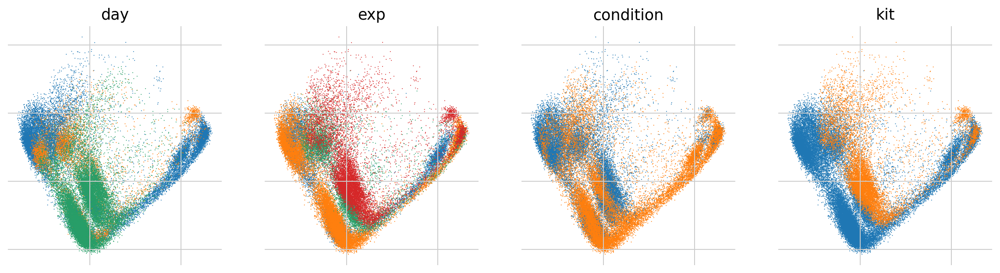

In [ ]:
## Show PCA with gene markers. 
scv.pl.pca(ad2, color=['day', 'exp', 'condition', 'kit'])

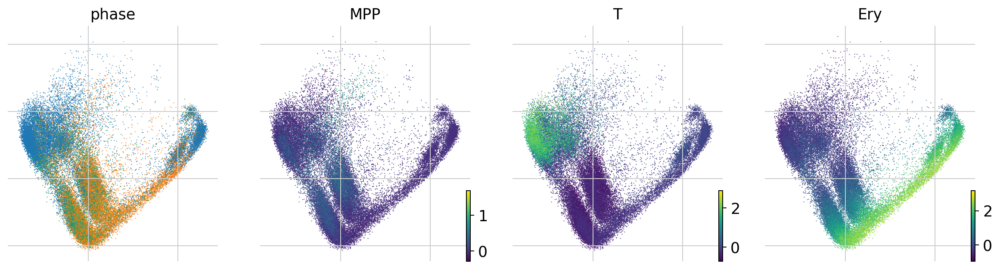

In [ ]:
## Show PCA with type-marking gene panels. 
scv.pl.pca(ad2, color=['phase', 'MPP', 'T', 'Ery'])

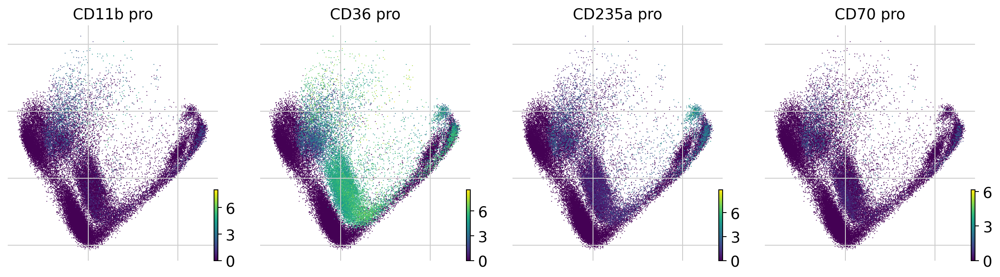

In [ ]:
## Show PCA with proteins. Log, but not scaled. 
#scv.pl.pca(ad2, color=['CD3_pro','CD11b_pro','CD14_pro','CD36_pro','CD70_pro','CD_71_pro', 'CD_117_pro', 'CD235a_pro'])
scv.pl.pca(ad2, color=['CD11b_pro', 'CD36_pro', 'CD235a_pro', 'CD70_pro'])

In [ ]:
## Combine two fields that are relevant to batch correction.  Not so good.
#ad2.obs['day_cycles'] = ad2.obs['day'].astype(str) + ad2.obs['exp'].astype(str) 
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("Day3","DayN")
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("Day6","DayN")
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("E1","_150")
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("E2","_150")
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("E3","_75")
#ad2.obs['day_cycles'] = ad2.obs['day_cycles'].str.replace("E4","_75")
#ad2.obs['day_cycles']

In [ ]:
## Combine two fields that are relevant to batch correction.  Good.
#ad2.obs['day_kit'] = ad2.obs['day'].astype(str) + ad2.obs['kit'].astype(str) 
#ad2.obs['day_kit'] = ad2.obs['day_kit'].str.replace("Day3","DayN")
#ad2.obs['day_kit'] = ad2.obs['day_kit'].str.replace("Day6","DayN")
#ad2.obs['day_kit']

In [ ]:
## Combine two fields that are relevant to batch correction.  Best.
## Exp 1 and 2 were the same.  SPARTA in 3.  75 cyles in 4.   
ad2.obs['day_exp'] = ad2.obs['day'].astype(str) + ad2.obs['exp'].astype(str) 
ad2.obs['day_exp'] = ad2.obs['day_exp'].str.replace("Day3","DayN")
ad2.obs['day_exp'] = ad2.obs['day_exp'].str.replace("Day6","DayN")
ad2.obs['day_exp'] = ad2.obs['day_exp'].str.replace("E1","E12")
ad2.obs['day_exp'] = ad2.obs['day_exp'].str.replace("E2","E12")
ad2.obs['day_exp']

newkey
AACTTTCGTTCGAATC-Day0-D1-E1      Day0E12
AAAGCAATCAACGCTA-Day0-D1-E1      Day0E12
AACTTTCAGGGAAACA-Day0-D1-E1      Day0E12
AATCCAGGTCTGGAGA-Day0-D1-E1      Day0E12
AATCCAGAGAGATGAG-Day0-D1-E1      Day0E12
                                  ...   
TTTGATCCAGACCTGC-Day6-N5M1-E4     DayNE4
TTTCACAGTGCCTAAT-Day6-N5M1-E4     DayNE4
TTTCGATGTCTTCAAG-Day6-N5M1-E4     DayNE4
TTTCAGTAGCATATGA-Day6-N5M1-E4     DayNE4
TTTCGATCATGGGAAC-Day6-N5M1-E4     DayNE4
Name: day_exp, Length: 48565, dtype: object

In [ ]:
## Nearest Neighbors.  Correct for day and exp.
## Default method angular is best. 
## Default set_op_mix_ratio=1, local_connectivity=1, trim=None, is best. 
## Default trim 
sce.pp.bbknn(ad2, batch_key='day_exp', n_pcs=25)

In [ ]:
## UMAP.  Reduce min_dist from default 0.5 for more clumping. 
scv.tl.umap(ad2, min_dist=0.25) 

In [ ]:
## Cluster.  Higher resolution for more clusters. 
scv.tl.louvain(ad2, resolution=1.9)
sc.tl.leiden(ad2, resolution=1.9) 

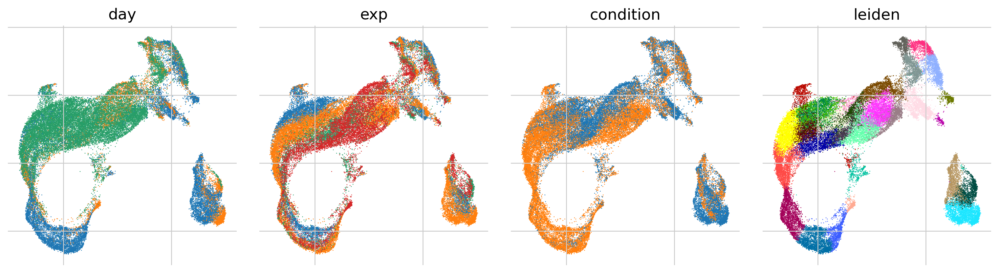

In [ ]:
## UMAPs of sample types.  
scv.pl.umap(ad2, color=['day', 'exp', 'condition', 'leiden'], wspace=0.1, dpi=120, legend_fontsize=9)

In [ ]:
#scv.pl.umap(ad2, color=['leiden'], groups=['15', '17', '10', '28'])

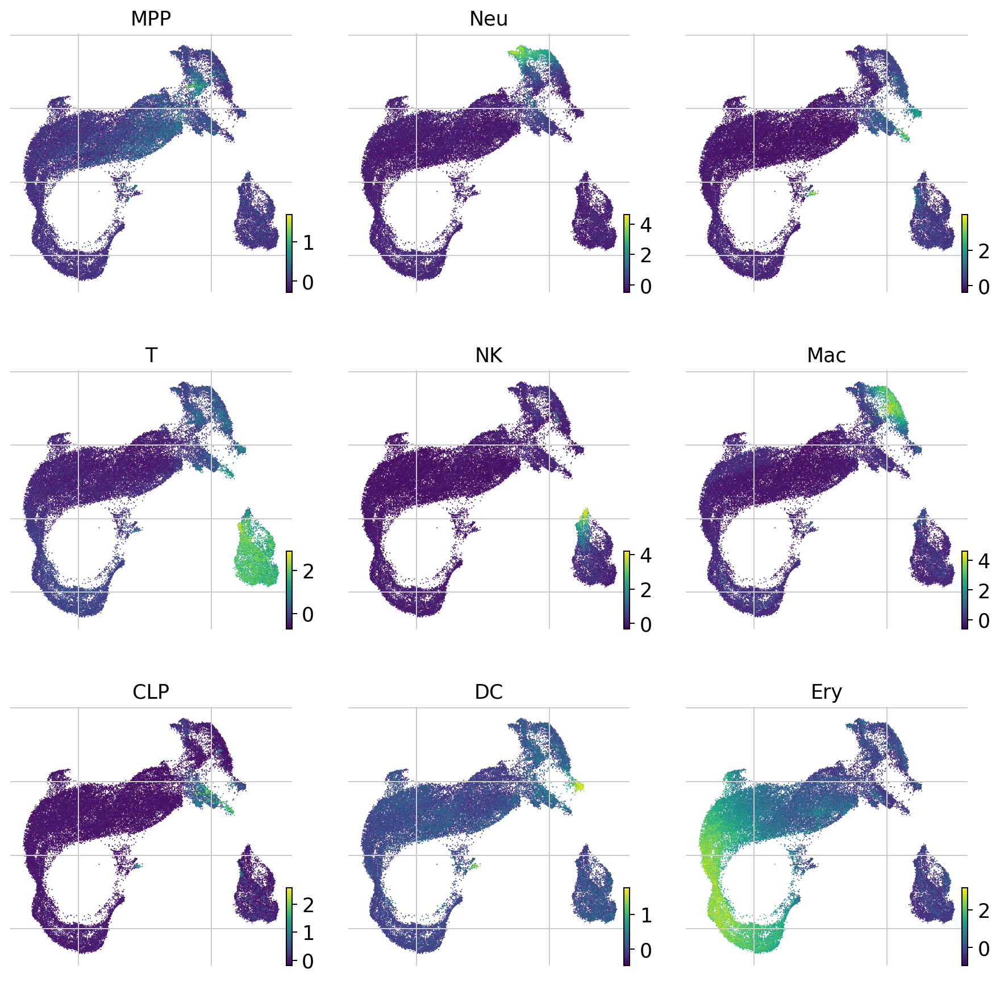

In [ ]:
## Plot cell type panels.  (See how order is determined later, from dendrogram)
typemarkers = ['MPP', 'CLP', 'Ery', 'Meg', 'Neu', 'Mac', 'B', 'NK', 'T', 'DC', 'Mast', 'phase']
typemarkers = ['MPP', 'Neu', 'B', 'T', 'NK', 'Mac', 'CLP', 'DC', 'Ery']
scv.pl.umap(ad2, color=typemarkers, ncols=3) 

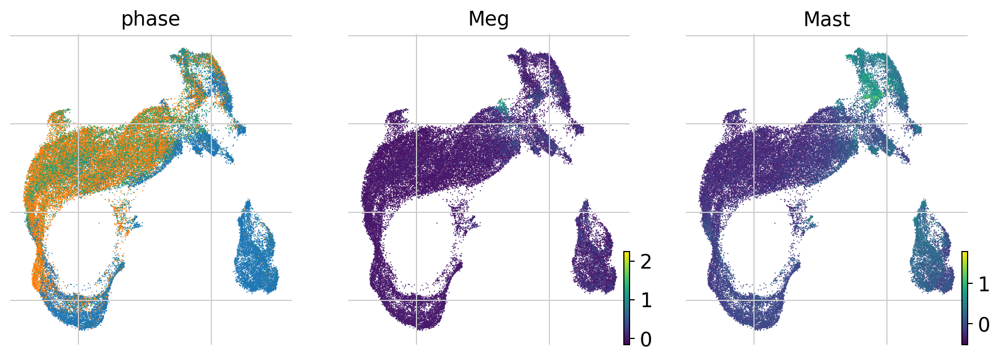

In [ ]:
## The other markers, not needed for paper, but helpful.  
typemarkers = ['phase', 'Meg', 'Mast']
scv.pl.umap(ad2, color=typemarkers, ncols=3) 

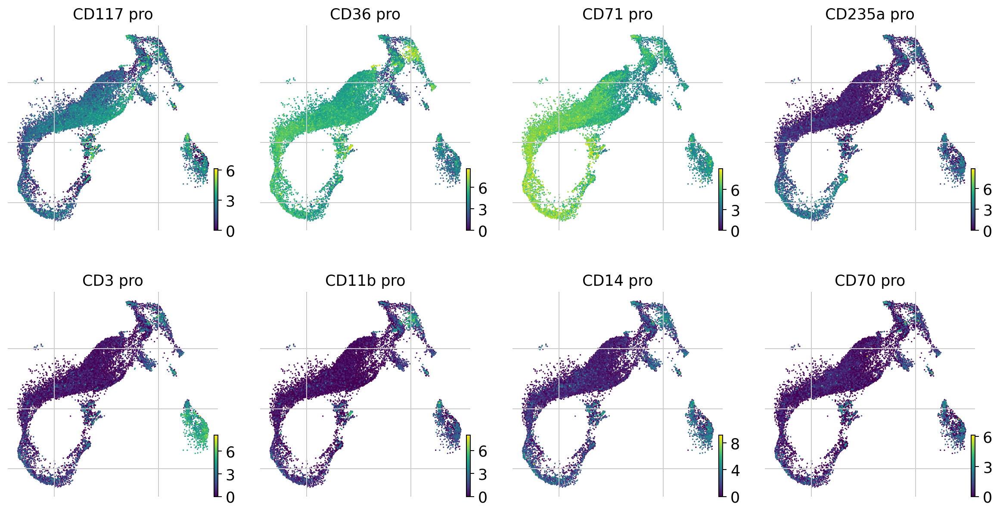

In [ ]:
## The surface markers.  For Fig S2b.  
typemarkers = ['CD117_pro', 'CD36_pro', 'CD71_pro', 'CD235a_pro', 'CD3_pro', 'CD11b_pro', 'CD14_pro', 'CD70_pro']
scv.pl.umap(ad2[(ad2.obs['exp']=='E3') | (ad2.obs['exp']=='E4')], color=typemarkers, ncols=4) 

### Look at subsets on the UMAP

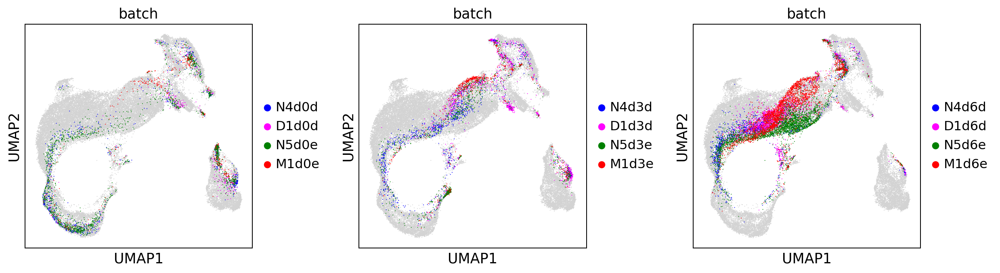

In [ ]:
## UMAPs of Day 0, 3, 6 samples individually.   
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(3*4+2, 4))
colors = dict(N4="blue", N5="green", D1="magenta", M1="red", N1="cyan", N2="purple", N3="aqua", D2="orange") 
palette = [colors[x[0:2]] for x in list(ad2.obs['batch'].cat.categories)]
axes[0] = sc.pl.umap(ad2, color=['batch'], groups=['N4d0d', 'D1d0d', 'N5d0e', 'M1d0e'], ax=axes[0], show=False, palette=palette)
axes[1] = sc.pl.umap(ad2, color=['batch'], groups=['N4d3d', 'D1d3d', 'N5d3e', 'M1d3e'], ax=axes[1], show=False, palette=palette)
axes[2] = sc.pl.umap(ad2, color=['batch'], groups=['N4d6d', 'D1d6d', 'N5d6e', 'M1d6e'], ax=axes[2], show=False, palette=palette)
fig.tight_layout()

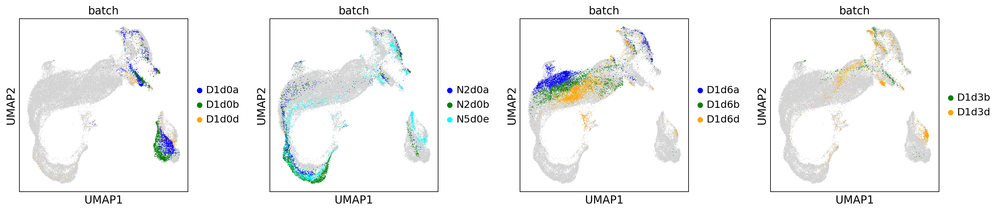

In [ ]:
## UMAPs of replicates.  Overlapping well -> normalization  acceptable. 
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(4*4+2, 4))
colors = dict(a="blue", b="green", c="red", d="orange", e="cyan", f="purple", g="aqua", h="magenta") 
palette = [colors[x[4]] for x in list(ad2.obs['batch'].cat.categories)]
axes[0] = sc.pl.umap(ad2, color=['batch'], groups=['D1d0a', 'D1d0b', 'D1d0d'], ax=axes[0], show=False, palette=palette)
axes[1] = sc.pl.umap(ad2, color=['batch'], groups=['N2d0a', 'N2d0b', 'N5d0e'], ax=axes[1], show=False, palette=palette)
axes[2] = sc.pl.umap(ad2, color=['batch'], groups=['D1d6a', 'D1d6b', 'D1d6d'], ax=axes[2], show=False, palette=palette)
axes[3] = sc.pl.umap(ad2, color=['batch'], groups=['D1d3b', 'D1d3d'], ax=axes[3], show=False, palette=palette)
fig.tight_layout()

In [ ]:
gc.collect()

0

### Cell type identification

In [ ]:
## Marker genes for each leiden/louvain cluster. 
sc.tl.rank_genes_groups(ad2, groupby='leiden', use_raw=False)

In [ ]:
## Show marker genes.
#sc.pl.rank_genes_groups_matrixplot(adata2, n_genes=10, swap_axes=False, dendrogram=False)
#sc.tl.dendrogram(ad2, groupby='leiden')
#_ = sc.pl.rank_genes_groups_dotplot(ad2, n_genes=3, dendrogram=True)  #, figsize=(24,6), vmax=1

In [ ]:
## Here is a way to list all of the significantly enriched genes in a cluster.
## The biggest cluster (0) is usually a T cell. 
def significant_genes(anndata, cluster, threshold=0.05): 
  ## Get the list of 100 genes and their p-values.
  names = list(pd.DataFrame(anndata.uns['rank_genes_groups']['names']).iloc[:,cluster])
  pvals = list(pd.DataFrame(anndata.uns['rank_genes_groups']['pvals']).iloc[:,cluster])
  ## Count how many have p-values that are significant. 
  n = len([1 for p in pvals if p < threshold]) 
  return list(names[:n])

print("cluster=0:", *significant_genes(ad2, 0))

cluster=0: HBA1 BLVRB AHSP HBA2 RPL7A RPSA RPL3 RPLP0 TMEM14C RPL5 UBAC1 RPL13A TUBA1B MPC2 EEF1B2 GYPA RPL10 YBX1 RPL10A RPL4 CA2 RPS3A RPL12 RPL9 TUBB RPS27A HEBP1 RPS20 RPL7 GYPC RPL14 S100A6 HMGA1 RPLP1 RPL21 RPL8 HMGB2 CD36 RPS5 KLF1 RPS18 RPS28 RPL32 H2AFZ FTH1 RPS10 RPS7 ALAS2 RPL18A RPS12 RPL24 RPL23 RPS8 SLC25A6 TUBG1 HBB RPS16 RPL35 NACA EEF1A1 RPS6 RPS3 HEMGN SMIM1 RPS27 HMBS EEF2 SLC25A37 REXO2 RPS24 RPL29 CHCHD2 PRDX2 RPL36A ANP32B SNRPE HES6 RPL27A BTF3 RPL27 RPL23A TPM1 CYC1 GFI1B RPL19 RPS15A RFESD CA1 TK1 RPL31 GYPB RPS9 RPS26 RPS19 RPL13 RACK1 EIF3F AP2M1 TYMS RPL22L1 HSPD1 UQCRH EIF3L RPS15 RPS4X RPL11 UQCRB SRP14 FECH ATP5MG CAST MGST3 LGALS3 DUT HINT1 RPS14 FAU SMC4 EIF3K RBX1 ATP5PO MT-CO3 HIST1H4C SLC4A1 BIRC5 ATP5MC1 RPL34 NPM1 CKS1B PCNA NFIA MCM7 COX7A2 RPLP2 HSPE1 DNAJA4 HTRA2 PTMA CENPN PSMB1 MLLT3 SOD1 TPI1 HNRNPA1 EIF3H KCNH2 CDK4 RHAG GCLM MT-CO2 SNX3 PSMA7 PSAT1 GHITM CCNB2 ALAD GSTO1 SMC2 AC104389.5 HBM COX7B CCT6A FTL MTHFD2 RPL28 PTTG1 NDUFA4 AC084033

In [ ]:
## A table to help determine cell type for each cluster.
df = pd.DataFrame()
## Loop through clusters.
for j in list(set(ad2.obs['leiden'])): 
  adj = ad2[ad2.obs['leiden']==j]
  ## Loop through cell types. 
  for i in markers.keys():  
    df.loc[i,j] = np.around(np.average(adj.obs_vector(i)), 2)
df.reindex(sorted(df.columns), axis=1)

,0,1,10,11,12,13,14,15,16,17,18,19,2,20,21,22,23,24,25,26,27,28,29,3,4,5,6,7,8,9
T,-0.42,1.46,-0.43,1.45,1.41,0.07,-0.39,-0.47,0.01,-0.51,-0.51,-0.52,-0.52,-0.02,-0.47,-0.04,-0.14,-0.35,0.38,-0.04,-0.03,-0.52,0.93,-0.28,-0.45,-0.02,-0.10,-0.02,-0.48,-0.43
Mac,-0.24,-0.08,-0.38,0.01,-0.07,2.12,-0.31,-0.35,0.16,-0.38,-0.43,-0.26,-0.42,0.01,-0.40,2.31,0.26,-0.15,0.34,0.02,-0.01,-0.35,-0.10,-0.21,-0.23,0.04,-0.04,-0.09,-0.35,-0.36
B,-0.15,0.16,-0.20,0.22,0.12,0.52,-0.16,-0.19,-0.05,-0.21,-0.22,-0.18,-0.22,0.02,-0.20,0.30,0.09,-0.11,1.53,0.32,-0.00,-0.15,2.02,-0.11,-0.15,0.03,-0.01,0.57,-0.08,-0.19
DC,-0.08,-0.02,-0.08,-0.09,-0.03,0.05,-0.01,-0.08,0.05,-0.04,-0.07,-0.08,-0.11,-0.01,-0.02,0.00,-0.00,-0.01,1.26,0.13,-0.01,-0.12,0.12,-0.07,-0.01,-0.04,-0.07,0.08,-0.15,-0.02
NK,-0.13,0.05,-0.16,1.28,0.07,-0.00,-0.13,-0.15,-0.00,-0.16,-0.14,-0.17,-0.17,-0.01,-0.14,0.11,0.04,-0.08,-0.07,-0.05,-0.00,-0.14,-0.03,-0.10,-0.15,0.00,-0.03,0.02,-0.08,-0.15
Neu,-0.17,-0.09,-0.20,-0.12,-0.07,0.10,-0.17,-0.22,0.28,-0.21,-0.21,-0.16,-0.26,0.00,-0.20,1.73,2.71,-0.08,-0.12,-0.05,-0.00,-0.13,-0.09,-0.14,-0.16,0.01,-0.04,0.27,-0.12,-0.20
Ery,1.53,-0.40,-0.01,-0.40,-0.34,-0.25,0.08,1.00,-0.30,0.32,0.12,0.59,0.11,1.40,0.15,-0.30,-0.19,0.77,-0.37,0.10,0.65,0.23,-0.37,2.08,0.57,1.78,2.25,-0.29,-0.24,0.82
Meg,-0.04,0.02,-0.05,0.04,0.01,0.04,0.05,-0.04,0.04,-0.04,-0.04,-0.04,0.00,-0.00,-0.04,0.00,0.00,-0.02,-0.01,0.02,-0.00,-0.02,0.03,-0.03,-0.04,-0.00,-0.02,0.06,0.12,-0.05
Mast,-0.31,0.00,-0.20,0.21,0.03,0.24,-0.02,-0.29,0.58,-0.28,-0.28,-0.31,-0.16,-0.02,-0.28,0.37,0.40,-0.27,0.13,-0.02,-0.00,-0.28,-0.10,-0.22,-0.31,-0.04,-0.11,0.03,-0.12,-0.30
MPP,-0.07,-0.04,0.11,-0.04,-0.02,-0.02,0.15,-0.04,0.26,-0.03,-0.01,-0.08,0.11,-0.02,-0.02,-0.02,-0.00,-0.06,-0.05,0.07,-0.01,-0.05,-0.03,-0.06,-0.06,-0.03,-0.04,0.05,0.04,-0.03


In [ ]:
## Create 'lineage' to name the related clusters. 
## Use Ery, Lym, Mye, MPP, Mit, DC, B. 
ad2.obs['lineage'] = ad2.obs['leiden']

lineage = {str(i):'Ery1' for i in range(len(list(set(ad2.obs['leiden']))))}
for i in [6,5,20,27]:  lineage[str(i)] = 'Ery2' 
for i in [1,12]:  lineage[str(i)] = 'T' 
for i in [13,22]:  lineage[str(i)] = 'Mac' 
for i in [29]:  lineage[str(i)] = 'B'  
for i in [25]:  lineage[str(i)] = 'DC' 
for i in [11]:  lineage[str(i)] = 'NK' 
for i in [23]:  lineage[str(i)] = 'Neu'
for i in [7]:  lineage[str(i)] = 'CLP'
#for i in [99]:  lineage[str(i)] = 'Meg'
#for i in [99]:  lineage[str(i)] = 'Mast'
#for i in [24]:  lineage[str(i)] = 'Mito'
for i in [16]:  lineage[str(i)] = 'MPP' ## Multipotent Progenitor.  

for n,name in lineage.items(): 
  ad2.obs['lineage'].replace(str(n), name, inplace=True)
lineages = list(set(lineage.values()))
print(lineages)

['Mac', 'NK', 'Ery2', 'CLP', 'DC', 'MPP', 'B', 'Neu', 'T', 'Ery1']


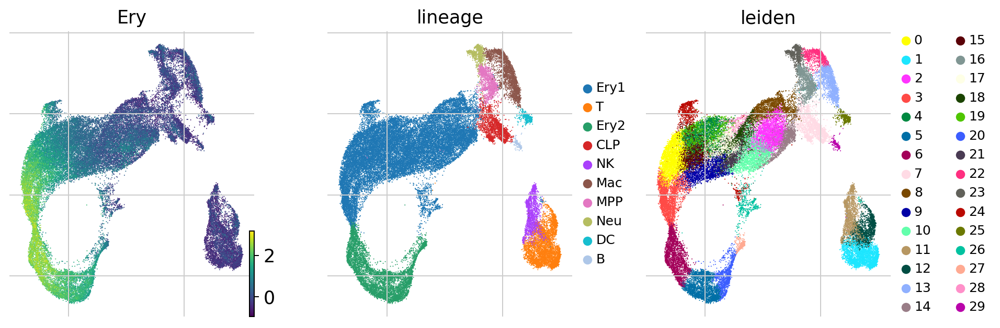

In [ ]:
## Plot cell type panels. List(markers.keys())
scv.pl.umap(ad2, color=['Ery', 'lineage', 'leiden'], wspace=0.3, legend_fontsize=10, legend_loc='on right')

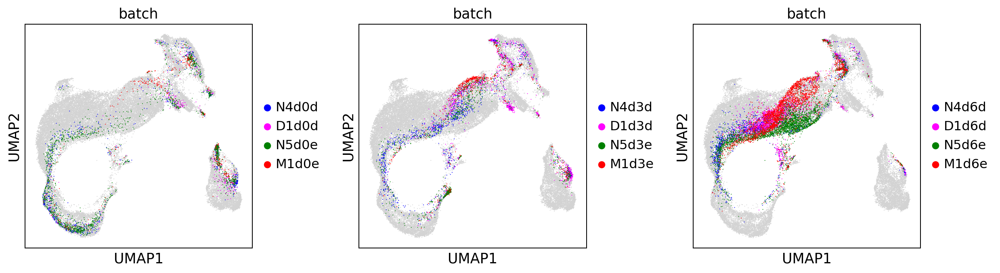

In [ ]:
## UMAPs of Day 0, 3, 6 samples individually.   
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(3*4+2, 4))
colors = dict(N4="blue", N5="green", D1="magenta", M1="red", N1="cyan", N2="purple", N3="aqua", D2="orange") 
palette = [colors[x[0:2]] for x in list(ad2.obs['batch'].cat.categories)]
axes[0] = sc.pl.umap(ad2, color=['batch'], groups=['N4d0d', 'D1d0d', 'N5d0e', 'M1d0e'], ax=axes[0], show=False, palette=palette)
axes[1] = sc.pl.umap(ad2, color=['batch'], groups=['N4d3d', 'D1d3d', 'N5d3e', 'M1d3e'], ax=axes[1], show=False, palette=palette)
axes[2] = sc.pl.umap(ad2, color=['batch'], groups=['N4d6d', 'D1d6d', 'N5d6e', 'M1d6e'], ax=axes[2], show=False, palette=palette)
fig.tight_layout()

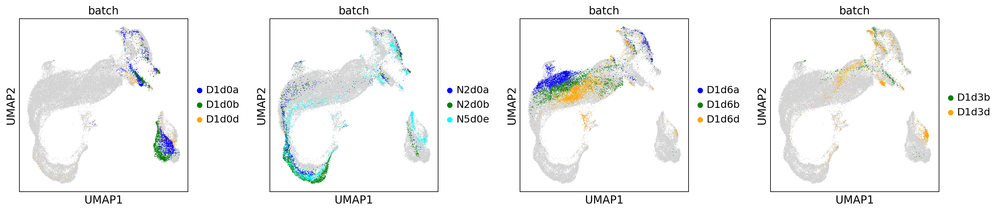

In [ ]:
## UMAPs of replicates.  Overlapping well -> normalization  acceptable. 
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(4*4+2, 4))
colors = dict(a="blue", b="green", c="red", d="orange", e="cyan", f="purple", g="aqua", h="magenta") 
palette = [colors[x[4]] for x in list(ad2.obs['batch'].cat.categories)]
axes[0] = sc.pl.umap(ad2, color=['batch'], groups=['D1d0a', 'D1d0b', 'D1d0d'], ax=axes[0], show=False, palette=palette)
axes[1] = sc.pl.umap(ad2, color=['batch'], groups=['N2d0a', 'N2d0b', 'N5d0e'], ax=axes[1], show=False, palette=palette)
axes[2] = sc.pl.umap(ad2, color=['batch'], groups=['D1d6a', 'D1d6b', 'D1d6d'], ax=axes[2], show=False, palette=palette)
axes[3] = sc.pl.umap(ad2, color=['batch'], groups=['D1d3b', 'D1d3d'], ax=axes[3], show=False, palette=palette)
fig.tight_layout()

### Figure 1a

In [ ]:
from matplotlib import cm
cm.tab10.colors

((0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529))

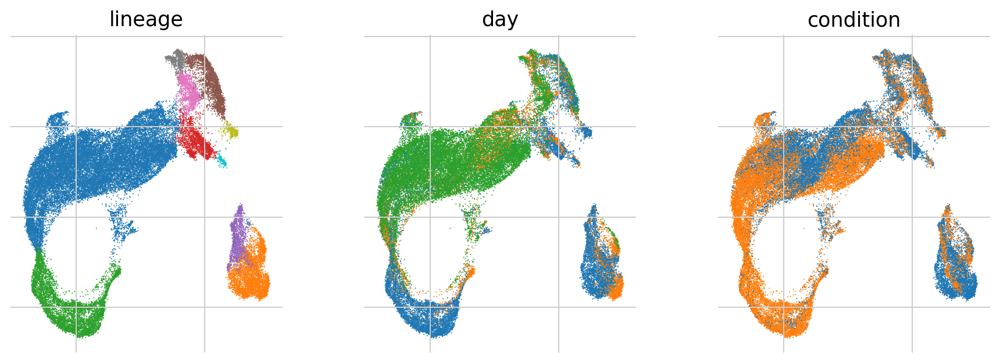

In [ ]:
## Plot these celltypes on UMAP. 
#scv.pl.umap(ad2, color=['lineage', 'day', 'condition'], wspace=0.3)
scv.pl.umap(ad2, color=['lineage', 'day', 'condition'], wspace=0.3, palette=cm.tab10.colors)

In [ ]:
## Marker genes for each lineage. 
## ['Ery2', 'DC', 'Mac', 'Neu', 'CLP', 'Ery1', 'T', 'MPP', 'NK', 'B']
sc.tl.rank_genes_groups(ad2, groupby='lineage', use_raw=False) 

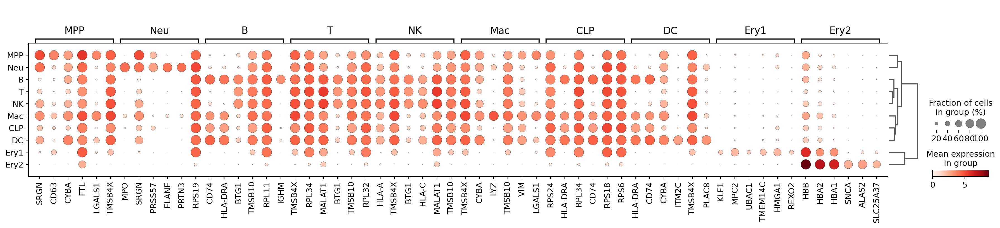

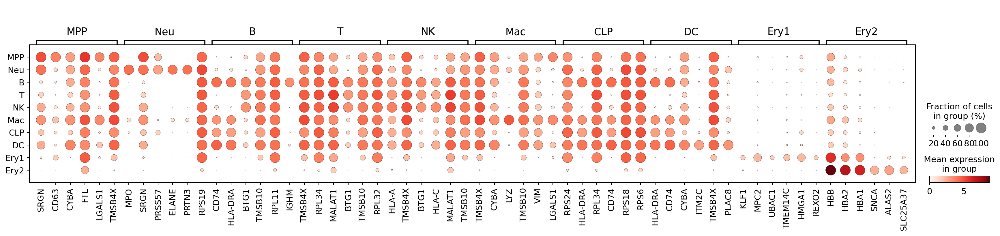

In [ ]:
## Show marker genes.
#sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10, swap_axes=False, dendrogram=False, figsize=(18,4))
sc.tl.dendrogram(ad2, groupby='lineage')
_ = sc.pl.rank_genes_groups_dotplot(ad2, n_genes=6, dendrogram=True, smallest_dot=0, dot_max=1, standard_scale=None, expression_cutoff=2)  ## vmax=1

## Reorder?  No, order by dendrogram.  
grouporder = ['MPP', 'Neu', 'B', 'T', 'NK', 'Mac', 'CLP', 'DC', 'Ery1', 'Ery2']
#_ = sc.pl.rank_genes_groups_dotplot(ad2, n_genes=6, dendrogram=False, smallest_dot=0, dot_max=1, groups=grouporder, categories_order=grouporder, expression_cutoff=2)  ## vmax=1

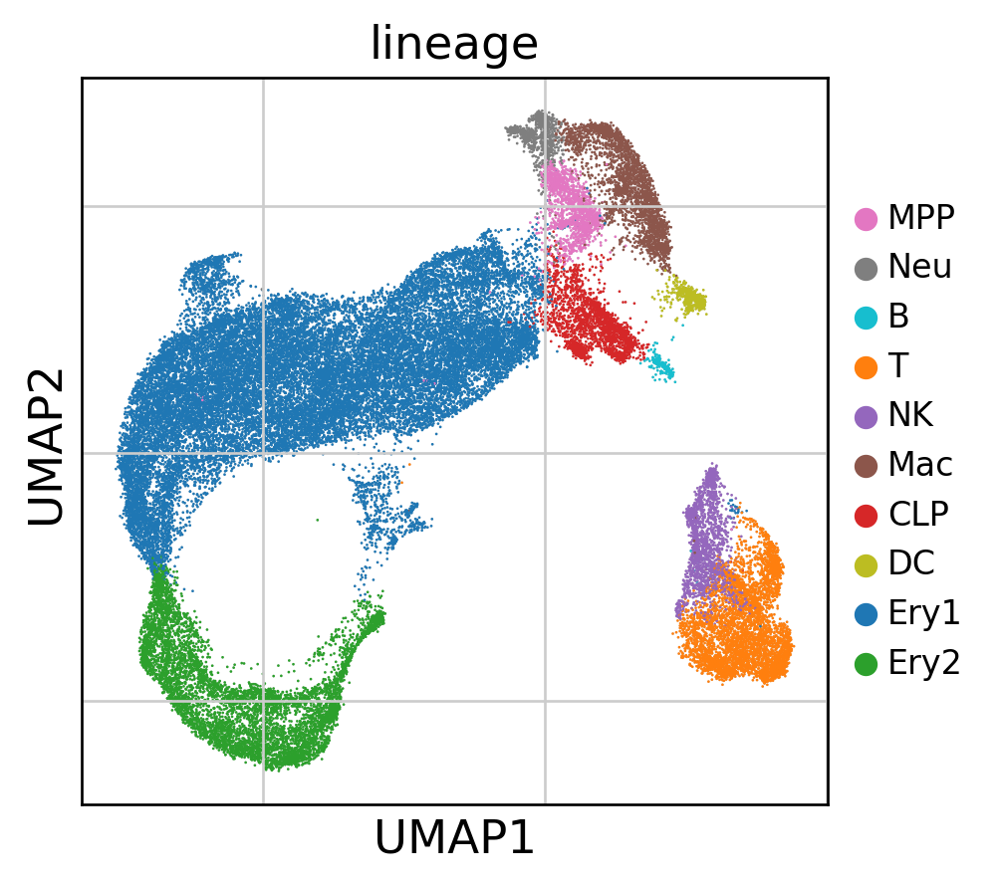

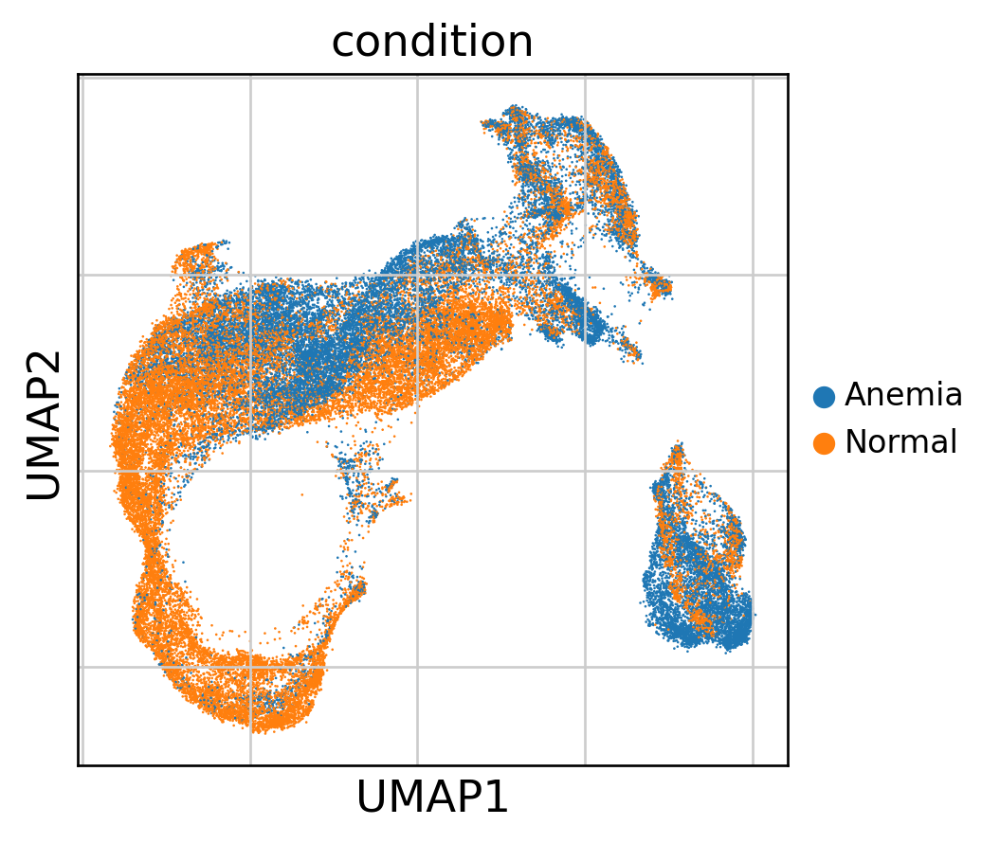

In [ ]:
## Plot for paper.  
scv.pl.umap(ad2, color=['lineage', ], wspace=0.3, dpi=120, legend_fontsize=10, legend_loc='on right', groups=grouporder, frameon=True)
scv.pl.umap(ad2, color=['condition'], wspace=0.3, dpi=120, legend_fontsize=10, legend_loc='on right', frameon=True)

### Figure 1c

In [ ]:
## Function to rotate the color pallete so my plots are consistent.  
def rotate_colors(i):
  from matplotlib import cm
  c = cm.tab10.colors
  return (c + c)[i:(i+len(c))]

rotate_colors(3)

((0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313))

... storing 'Day0' as categorical
... storing 'Day3' as categorical
... storing 'Day6' as categorical


23260

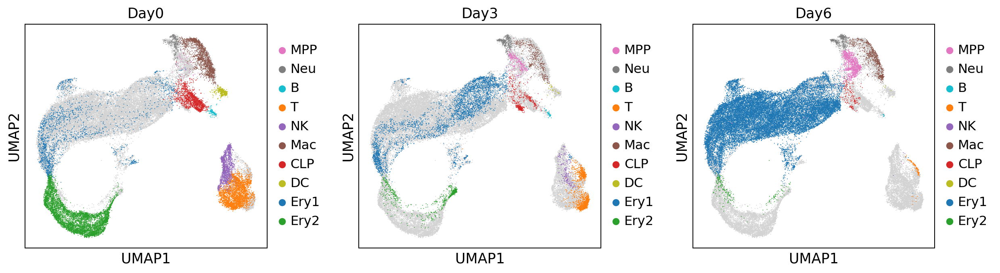

In [ ]:
## UMAPs of Day 0, 3, 6 samples individually.   
## This is a bit complicated.  We create one figure to hold three plots/axes.
## Create a temporary obs column with celltypes for each day. Other days called null.
## Need to adjust color palette to match previous.  
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(3*4+2, 4))

## Color order deduced to be B,CLP,DC,Ery1,Ery2,MPP?,Mac,NK,Neu,T.  Reorder colors. 
c = cm.tab10.colors
mycolors = (c[9], c[3], c[8], c[0], c[2], c[6], c[5], c[4], c[7], c[1])

ad2.obs['Day0'] = np.where(ad2.obs['day']=="Day0", ad2.obs['lineage'], "null")
celltypes = [x for x in list(set(ad2.obs['Day0'])) if x!="null"]
axes[0] = sc.pl.umap(ad2, color=['Day0'], groups=grouporder, ax=axes[0], show=False, palette=mycolors)
ad2.obs.drop('Day0', axis=1, inplace=True)

ad2.obs['Day3'] = np.where(ad2.obs['day']=="Day3", ad2.obs['lineage'], "null")
celltypes = [x for x in list(set(ad2.obs['Day3'])) if x!="null"]
axes[1] = sc.pl.umap(ad2, color=['Day3'], groups=grouporder, ax=axes[1], show=False, palette=mycolors)
ad2.obs.drop('Day3', axis=1, inplace=True)

ad2.obs['Day6'] = np.where(ad2.obs['day']=="Day6", ad2.obs['lineage'], "null")
celltypes = [x for x in list(set(ad2.obs['Day6'])) if x!="null"]
axes[2] = sc.pl.umap(ad2, color=['Day6'], groups=grouporder, ax=axes[2], show=False, palette=mycolors)
ad2.obs.drop('Day6', axis=1, inplace=True)

fig.tight_layout()
gc.collect()

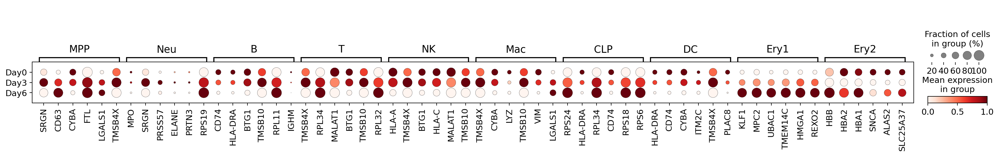

In [ ]:
## Dotplots can reflect cell numbers. 
#groups = ['MPP', 'Neu', 'B', 'T', 'NK', 'Mac', 'CLP', 'DC', 'Ery1', 'Ery2']
#_ = sc.pl.rank_genes_groups_dotplot(ad2, groupby='day', groups=grouporder, n_genes=6, dendrogram=False, dot_min=0, dot_max=1, standard_scale='group')
_ = sc.pl.rank_genes_groups_dotplot(ad2, groupby='day', groups=grouporder, n_genes=6, dendrogram=False, dot_min=0, dot_max=1, standard_scale='var')

In [ ]:
## Make a DataFrame table to help determine cell type for each cluster.
days = sorted(set(ad2.obs['day']))  ## Three days in columns. 
lineages = sorted(set(ad2.obs['lineage']))  ## Seven lineages in rows. 
countbytype = {"Lineage": lineages}  ## Data into a dictionary. 
for xd in days:
  adx = ad2[ad2.obs['day']==xd]  ## Slice data by day. 
  countbytype[xd] = [len(adx[adx.obs['lineage']==xl]) for xl in lineages] 

## Hard-code the results here, just so we don't forget. 
#print(countbytype)
countbytype = pd.DataFrame(countbytype)  ## Convert to DataFrame. 
#countybytype = {'Lineage': ['B', 'DC', 'Ery', 'Lym', 'MPP', 'Mit', 'Mye'], 'Day0': [190, 624, 6971, 4891, 1581, 226, 2049], 'Day3': [49, 19, 3821, 1564, 597, 182, 1155], 'Day6': [5, 3, 21350, 105, 185, 577, 2370]}
#countbytype = countbytype.append(dict(Lineage="TOTAL", Day0=16677, Day3=7439, Day6=24693), ignore_index=True) 	## Sum totals.
countbytype = countbytype.append(dict(Lineage="Runs", Day0=12, Day3=8, Day6=12), ignore_index=True) 	## Note Day 3 had fewer runs. 
countbytype

,Lineage,Day0,Day3,Day6
0,B,161,54,9
1,CLP,1434,501,168
2,DC,563,28,5
3,Ery1,1964,3783,21563
4,Ery2,5885,768,229
5,MPP,51,299,1103
6,Mac,1618,362,711
7,NK,1585,217,5
8,Neu,245,324,334
9,T,3186,1305,105


### Save results

We wish to save the AnnData object with the log1p, filtered, annotated data.  We might also wish to save a table with the lineage annotation for each cell because we may want to go back to the raw data and pick out subsets of cells. 

In [ ]:
ad2

AnnData object with n_obs × n_vars = 48565 × 7523
    obs: 'batch', 'condition', 'day', 'exp', 'id', 'kit', 'prob', 'barcode', 'trajectoryb', 'hap', 'reads', 'CD70_pro', 'CD36_pro', 'CD71_pro', 'CD3_pro', 'CD235a_pro', 'CD14_pro', 'CD117_pro', 'CD11b_pro', 'percent_mito', 'n_counts', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes', 'T', 'Mac', 'B', 'DC', 'NK', 'Neu', 'Ery', 'Meg', 'Mast', 'MPP', 'CLP', 'Mito', 'Hb', 'S_score', 'G2M_score', 'phase', 'day_exp', 'louvain', 'leiden', 'lineage'
    var: 'Accession', 'Chromosome-E1', 'End', 'Start', 'Strand-E1', 'Chromosome-E2', 'Strand-E2', 'Chromosome-E3', 'Strand-E3', 'Chromosome-E4', 'Strand-E4', 'gene_count_corr', 'keygene', 'means', 'dispersions', 'dispersions_norm', 'highly_variable'
    uns: 'pca', 'day_colors', 'exp_colors', 'condition_colors', 'kit_colors', 'phase_colors', 'neighbors', 'umap', 'louvain', 'leiden', 'leiden_colors', 'batch_colors', 'rank_genes_groups', 'lineage_colors', "dendrogram_['linea

In [ ]:
## Make a dataframe with 'lineage' and the gene panels it came from.  Save as CSV file. 
dfobs = ad2.obs.loc[:, ['lineage', 'leiden', 'batch', 'condition', 'day', 'exp', 'id', 'kit', 'trajectoryb', 'hap']]
dfobs.to_csv('heme_all4_lineages.201028.csv.gz', compression='gzip')
print(dfobs.head())
del dfobs; gc.collect()

## Test loading this lineage dataframe.
#!if ! [ -e 'heme_all4_lineages.20xxxx.csv.gz' ]; then gdown 'https://drive.google.com/uc?id=18FBxyOH5E7p1HtynZScuBuydea4s3SAn'; fi
#dfobs = pd.read_csv("heme_all4_lineages.201028.csv.gz") 

                            lineage leiden  batch  ... kit trajectoryb    hap
newkey                                             ...                       
AACTTTCGTTCGAATC-Day0-D1-E1       B     29  D1d0a  ...  v2       False  False
AAAGCAATCAACGCTA-Day0-D1-E1     CLP      7  D1d0a  ...  v2       False  False
AACTTTCAGGGAAACA-Day0-D1-E1     CLP      7  D1d0a  ...  v2       False  False
AATCCAGGTCTGGAGA-Day0-D1-E1       T      1  D1d0a  ...  v2       False  False
AATCCAGAGAGATGAG-Day0-D1-E1       T     12  D1d0a  ...  v2       False  False

[5 rows x 10 columns]


15796

In [ ]:
## Save main annData object. 
ad2.write("heme_velo_4exp_step01_lineage.201028.h5ad", compression="gzip")  ## 396MB file.
#ad2.write_loom("heme_velo_4exp_step01_lineage.201028.loom", write_obsm_varm=True) 

In [ ]:
!ls -lh *.loom *.h5ad

ls: cannot access '*.loom': No such file or directory
-rw-r--r-- 1 root root 869M Nov  5 19:26  heme_velo_4exp_step00.raw.200406.h5ad
-rw-r--r-- 1 root root 400M Nov  5 19:32  heme_velo_4exp_step01_lineage.201028.h5ad


In [ ]:
## Save h5ad files to GDrive.
#from google.colab import drive
#drive.mount('/content/drive')

#!cp heme_all4_lineages.201028.csv.gz "/content/drive/My Drive/200312-aggregate"
#!cp heme_velo_4exp_step01_lineage.201028.h5ad "/content/drive/My Drive/200312-aggregate"

In [ ]:
pass

## END